In [ ]:
!pip install trimesh
!pip install tensorflow_graphics

In [ ]:
import numpy as np
import tensorflow as tf
import trimesh

import tensorflow_graphics.geometry.transformation as tfg_transformation
from tensorflow_graphics.notebooks import threejs_visualization

Cow

In [ ]:
# Download the mesh.
# Courtesy of Keenan Crane www.cs.cmu.edu/~kmcrane/Projects/ModelRepository/.
!wget -N https://storage.googleapis.com/tensorflow-graphics/notebooks/index/cow.obj

In [ ]:
# Load the mesh.
mesh = trimesh.load("cow.obj")
mesh = {"vertices": mesh.vertices, "faces": mesh.faces}

Pig

In [ ]:
# Load the mesh.
mesh = trimesh.load("pig_body.obj")
mesh = {"vertices": mesh.vertices, "faces": mesh.faces}

PittsburghBridge

In [ ]:
# Load the mesh.
mesh = trimesh.load("PittsburghBridge.obj")
mesh = {"vertices": mesh.vertices, "faces": mesh.faces}

Bob

In [ ]:
# Load the mesh.
mesh = trimesh.load("bob_controlmesh.obj")
mesh = {"vertices": mesh.vertices, "faces": mesh.faces}

unable to load materials from: bob_controlmesh.mtl
specified material (feathers)  not loaded!


Mesh Visualization

In [ ]:

# Visualize the original mesh.
_ = threejs_visualization.triangular_mesh_renderer(mesh, width=800, height=800)
# Set the axis and angle parameters.
axis = np.array((0., 1., 0.))  # y axis.
angle = np.array((np.pi / 4.,))  # 45 degree angle.
# Rotate the mesh.
mesh["vertices"] = tfg_transformation.axis_angle.rotate(mesh["vertices"], axis,
                                                        angle).numpy()
# Visualize the rotated mesh.
_ = threejs_visualization.triangular_mesh_renderer(mesh, width=800, height=800)

##Zadanie 2 

# CartoonGAN-TensorFlow2
Cartoonize your images using CartoonGAN, powered by TensorFlow 2.0. 

- [Blog post](https://leemeng.tw/generate-anime-using-cartoongan-and-tensorflow2-en.html)
- [Blog post (Traditional Chinese)](https://leemeng.tw/generate-anime-using-cartoongan-and-tensorflow2.html)
- [Github repo](https://github.com/mnicnc404/CartoonGan-tensorflow)

## Clone github  repo
This repo contain the Python script that we will use to generate cartoon-style images.

In [ ]:
import os
repo = "CartoonGan-tensorflow"
!git clone https://github.com/mnicnc404/{repo}.git
os.chdir(os.path.join(repo))

fatal: destination path 'CartoonGan-tensorflow' already exists and is not an empty directory.


In [ ]:
!ls | grep cartoonize.py

cartoonize.py


In [ ]:
from IPython.display import clear_output, display, Image

In [ ]:
!git clone https://www.github.com/keras-team/keras-contrib.git \
    && cd keras-contrib \
    && python convert_to_tf_keras.py \
    && USE_TF_KERAS=1 python setup.py install
clear_output()

In [ ]:
import tensorflow as tf

Download new images to cartoonize

In [ ]:
image_url = 'https://media.giphy.com/media/EcrGURaK4c7yZlZkzf/giphy.gif'  #@param {type: "string"}

In [ ]:
input_image_dir = "input_images"
output_image_dir = input_image_dir.replace("input_", "output_")

import time
if image_url:
    img_filename = image_url.split("/")[-1]
    name, ext = '.'.join(img_filename.split(".")[:-1]), img_filename.split(".")[-1]
    new_name = '_'.join((name, str(int(time.time()))))
    new_img_filename = '.'.join((new_name, ext))
    image_path = os.path.join(input_image_dir, new_img_filename)
    
    !wget {image_url} \
        && mv {img_filename} {new_img_filename} \
        && mv {new_img_filename} {image_path}

--2021-01-14 23:47:37--  https://media.giphy.com/media/EcrGURaK4c7yZlZkzf/giphy.gif
Resolving media.giphy.com (media.giphy.com)... 151.101.250.2
Connecting to media.giphy.com (media.giphy.com)|151.101.250.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2979625 (2.8M) [image/gif]
Saving to: ‘giphy.gif’

giphy.gif           100%[===================>]   2.84M  --.-KB/s    in 0.1s    

2021-01-14 23:47:37 (19.7 MB/s) - ‘giphy.gif’ saved [2979625/2979625]



## The image that we're going to cartoonize

In [ ]:
# a trick to show gif in notebook
if ".gif" in new_img_filename:
    png_path = new_img_filename + '.png'
    !cp {image_path} {png_path}

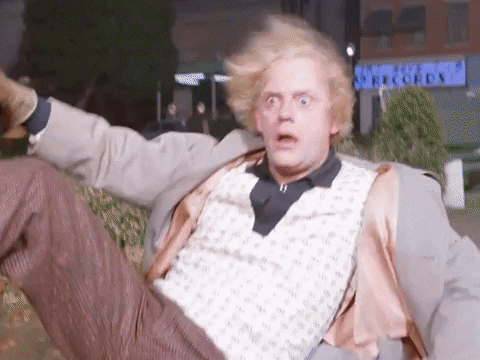

In [ ]:
display(Image(png_path))

## Cartoonize images using Python script
Transform the downloaded image using selected style.

In [ ]:
styles = "hosoda" #@param ["shinkai", "hayao", "hosoda", "paprika"]

In [ ]:
!python cartoonize.py \
    --styles {styles} \
    --batch_size 1 \
    --comparison_view horizontal

2021-01-14 23:47:59.425930: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
[2021-01-14 23:48:01] [Cartoonizer] [INFO] Transformed images will be saved to `output_images` folder.
2021-01-14 23:48:01.430418: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-01-14 23:48:01.431482: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-01-14 23:48:01.441454: E tensorflow/stream_executor/cuda/cuda_driver.cc:328] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-01-14 23:48:01.441509: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (9a99f1149249): /proc/driver/nvidia/version does not exist
2021-01-14 23:48:01.442221: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_

## Compare input with the caroonized result

In [ ]:
if img_filename:
    if ".gif" in img_filename:
        generated_gif = os.path.join(output_image_dir, "comparison", new_img_filename)
        result_path = generated_gif + '.png'
        !cp {generated_gif} {result_path}
    else:
        result_path = os.path.join(output_image_dir, "comparison", new_img_filename)

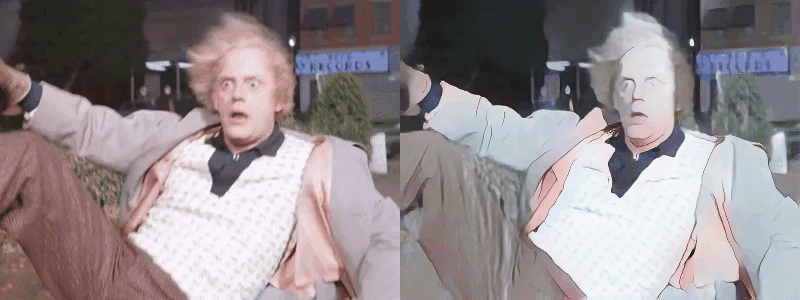

In [ ]:
display(Image(result_path))